In [1]:
import os 
import numpy as np
import torch
from PIL import Image
from tqdm.auto import tqdm

In [2]:
from sphere_helper import drawSphere

In [3]:
# read sh variable 
with open('/pure/tu150/datasets/relight/face/ffhq/ffhq-train-light-anno.txt')as f:
    sh_raw = f.readlines()

with open('/pure/tu150/datasets/relight/face/ffhq/ffhq-valid-light-anno.txt')as f:
    sh_raw += f.readlines()

In [4]:
sh_dict = {}
for line in tqdm(sh_raw):
    line = line.strip()
    components = line.split(' ')
    name = int(components[0].split('.')[0])
    sh = np.array([float(x) for x in components[1:]])
    #sh = torch.tensor(sh).reshape(9, 3)
    #sh = sh.numpy()
    sh = sh.reshape(9, 3)
    sh_dict[name] = sh

  0%|          | 0/70000 [00:00<?, ?it/s]

In [5]:
sh_list = []
for key in range(70000):
    sh_list.append(sh_dict[key])

In [6]:
sh_list = np.array(sh_list)

In [7]:
# convert to gray scael
sh_grays = sh_list[:, :, 0] * 0.299 + sh_list[:, :, 1] * 0.587 + sh_list[:, :, 2] * 0.114

In [8]:
np.sum(sh_grays[:2000,2] < 0.0)

435

/home/vll/venv_pytorch2.0/lib/python3.11/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


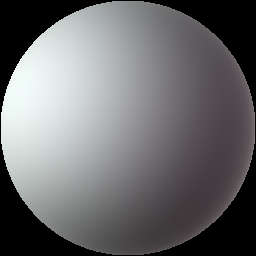

In [8]:
sphere = drawSphere(torch.tensor(sh_list[57]))
sphere = Image.fromarray((sphere.permute(1,2,0).numpy() * 255.0).astype(np.uint8))
display(sphere)

In [16]:
top_10_indices = np.argsort(sh_grays[69000:,2])[:10]
top_10_indices = top_10_indices + 69000
import json 
with open('light_y_minus.json', 'w') as f:
    output = []
    for i in range(10):
        output.append(f"{top_10_indices[i] // 1000 * 1000}/{top_10_indices[i]}")
    json.dump(output, f, indent=4)

[69013 69205 69838 69122 69759 69858 69212 69335 69308 69032]
ID:  69013 Y:  [-0.13988119 -0.45242753 -0.44529132]


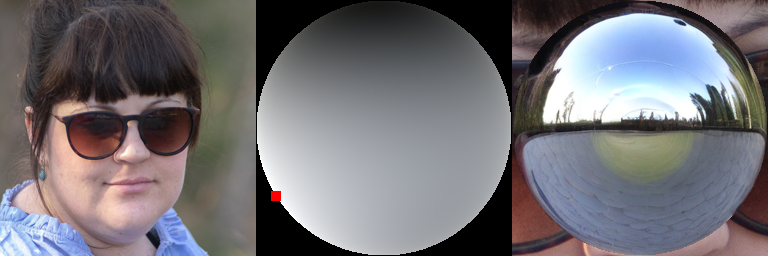

ID:  69205 Y:  [-0.15242061 -0.37869333 -0.3619266 ]


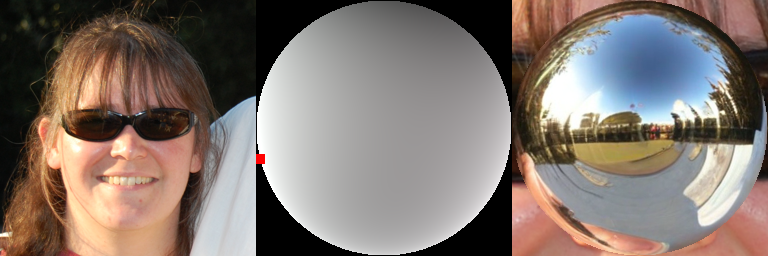

ID:  69838 Y:  [ 0.08314069 -0.36214515 -0.34095934]


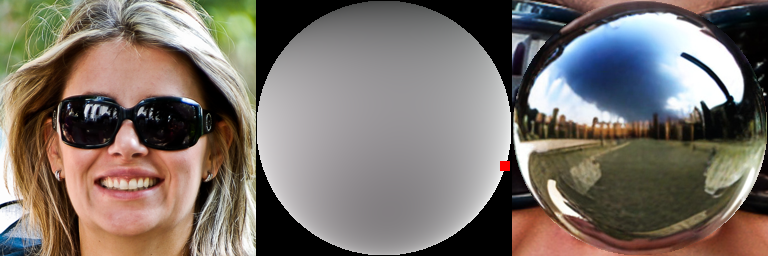

ID:  69122 Y:  [-0.37985609 -0.35933613 -0.35407509]


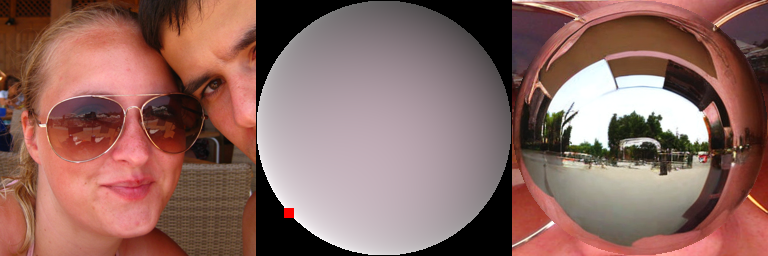

ID:  69759 Y:  [-0.07692789 -0.35370367 -0.28210164]


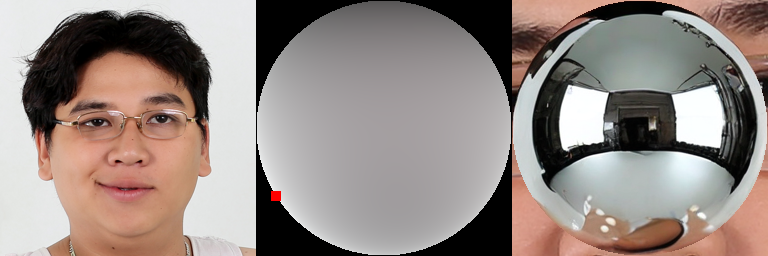

ID:  69858 Y:  [-0.22789359 -0.34215587 -0.37669471]


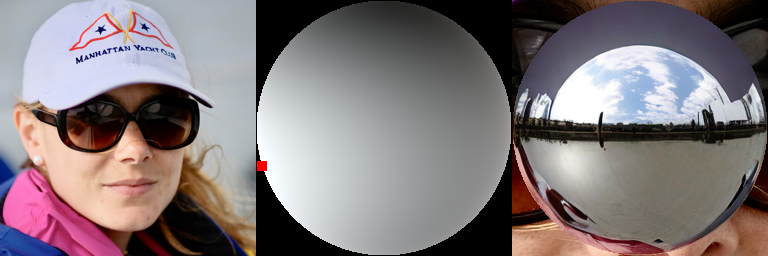

ID:  69212 Y:  [-0.15336014 -0.33754084 -0.32604996]


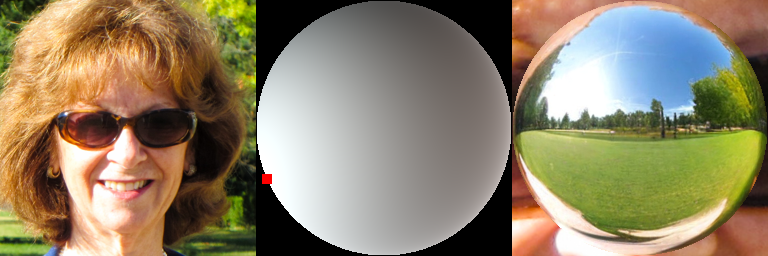

ID:  69335 Y:  [-0.19644124 -0.30898988 -0.22502731]


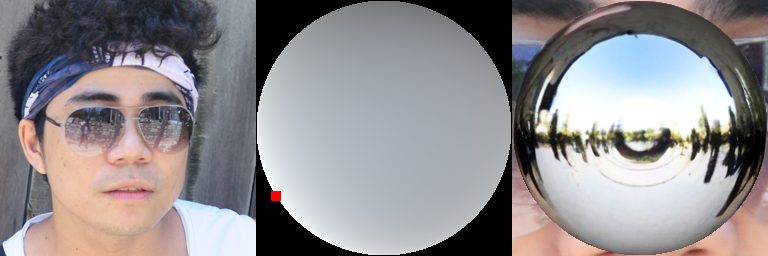

ID:  69308 Y:  [-0.2232944  -0.27585603 -0.27300048]


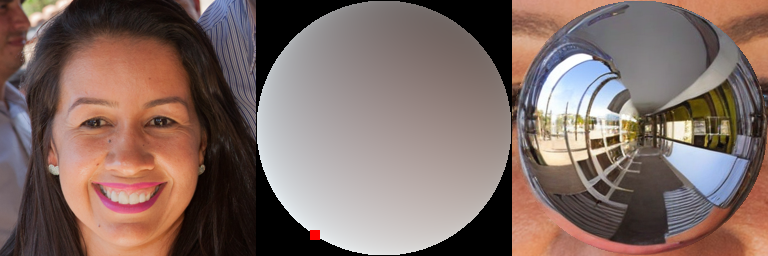

ID:  69032 Y:  [-0.04169137 -0.26716246 -0.44031997]


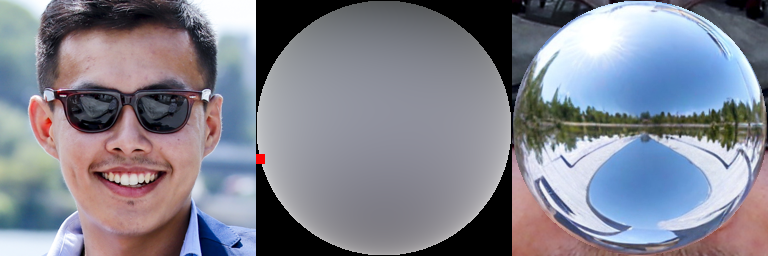

In [15]:
# look into y axis 
top_10_indices = np.argsort(sh_grays[69000:,2])[:10]
top_10_indices = top_10_indices + 69000
print(top_10_indices)
for i in top_10_indices[:10]:
    print("ID: ", i, "Y: ", sh_grays[i,1:4])
    #sphere = drawSphere(torch.tensor(sh_list[i]))
    # convert sphere from torch tensor to PIL image and display
    #sphere = Image.fromarray((sphere.permute(1,2,0).numpy() * 255.0).astype(np.uint8))
    sphere = Image.open(f'../../datasets/face/face70000/ball/{i // 1000 * 1000:05d}/{i:05d}.png').resize((256, 256))
    # get source image 
    source = Image.open(f'/pure/tu150/datasets/relight/face/ffhq/images/{i // 1000 * 1000:05d}/{i:05d}.png').resize((256, 256))
    # get ball image
    ball = Image.open(f'/pure/tu150/datasets/relight/face/ffhq/diffusionlight/{i // 1000 * 1000:05d}/square/{i:05d}_ev-00.png').resize((256, 256))    

    # merge source and sphere and ball into one image
    merged = Image.new('RGB', (768, 256))
    merged.paste(source, (0, 0))
    merged.paste(sphere, (256, 0))
    merged.paste(ball, (512, 0))
    display(merged)



In [12]:
# read prompts.json
import json
with open('/pure/tu150/datasets/relight/face/ffhq/prompts.json') as f:
    prompt = json.load(f)

[ 3807  1338  5733  7742  9845  2526  5304 16511  9195    46]
ID:  3807
Prompt:  a black man in a suit and tie smiling


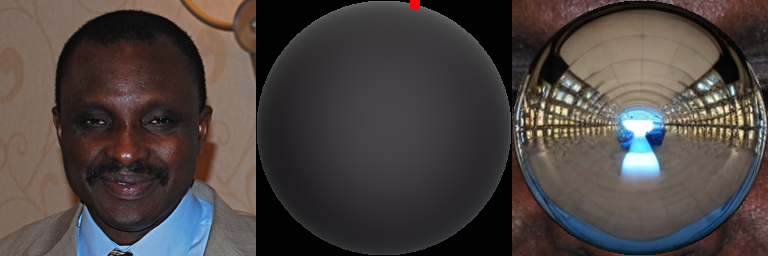

ID:  1338
Prompt:  a woman smiling with a scarf on her head


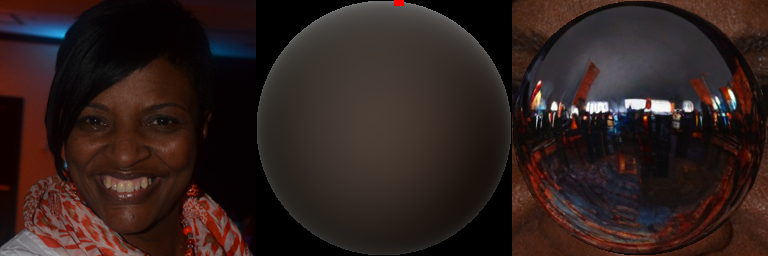

ID:  5733
Prompt:  man wearing a green shirt


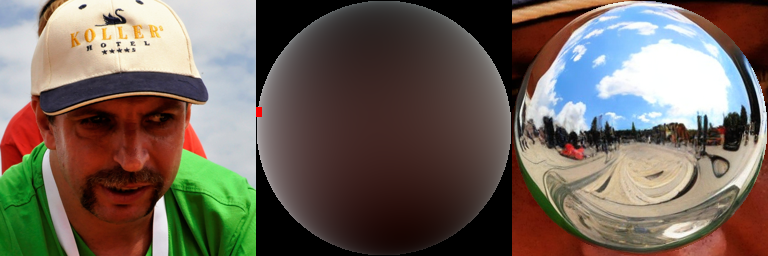

ID:  7742
Prompt:  a man in a white coat and tie at an event


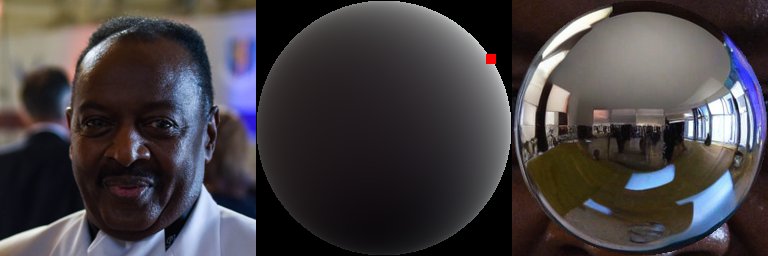

ID:  9845
Prompt:  a man wearing a white shirt


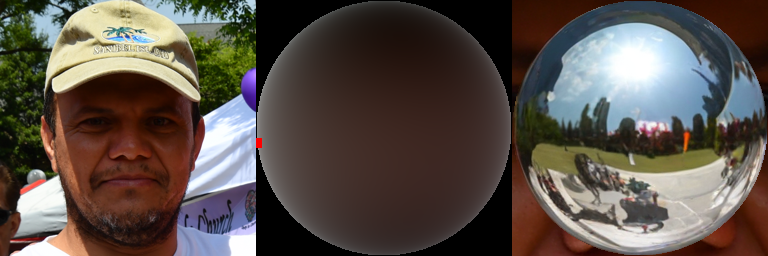

ID:  2526
Prompt:  a man with a blue sweater


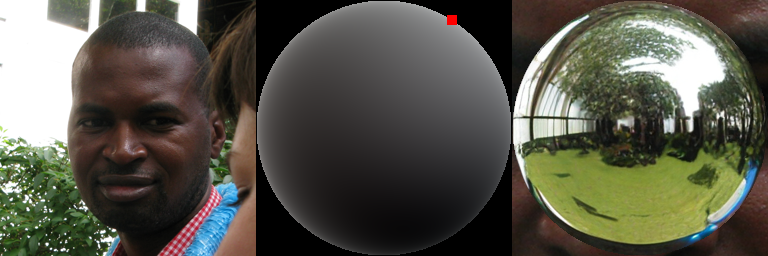

ID:  5304
Prompt:  a man wearing a red shirt


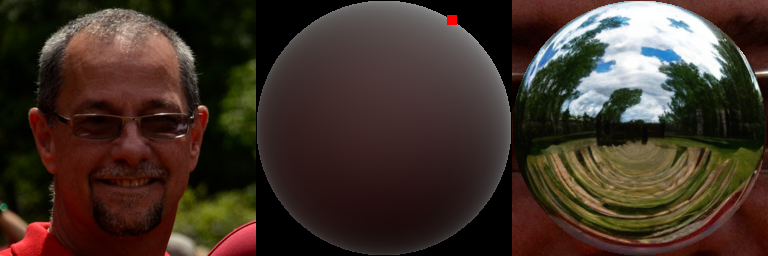

ID:  16511
Prompt:  a man with glasses and a green necktie


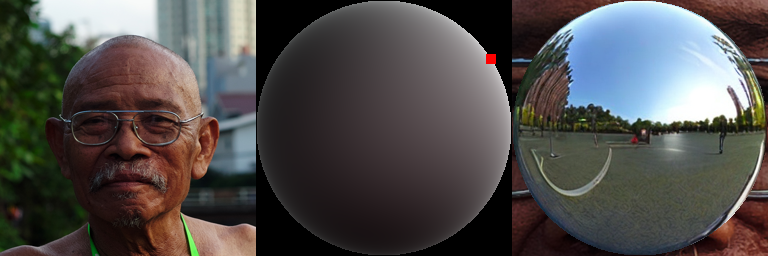

ID:  9195
Prompt:  a young boy wearing glasses and a blue shirt


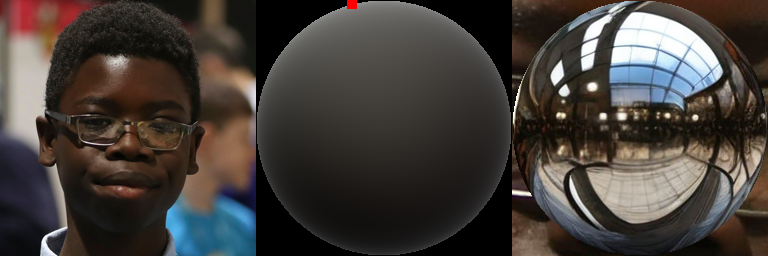

ID:  46
Prompt:  a man in a graduation cap and gown smiling


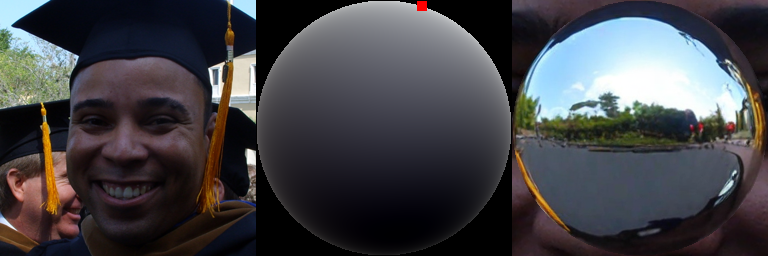

In [15]:
# look into z axis 
top_10_indices = np.argsort(sh_grays[:20000,3])[:10]
print(top_10_indices)
for i in top_10_indices:
    print("ID: ", i)
    print("Prompt: ", prompt[f"{i:05d}"])
    #sphere = drawSphere(torch.tensor(sh_list[i]))
    # convert sphere from torch tensor to PIL image and display
    #sphere = Image.fromarray((sphere.permute(1,2,0).numpy() * 255.0).astype(np.uint8))
    sphere = Image.open(f'../../datasets/face/face70000/ball/{i // 1000 * 1000:05d}/{i:05d}.png').resize((256, 256))    
    # get source image 
    source = Image.open(f'/pure/tu150/datasets/relight/face/ffhq/images/{i // 1000 * 1000:05d}/{i:05d}.png').resize((256, 256))
    # get ball image
    ball = Image.open(f'/pure/tu150/datasets/relight/face/ffhq/diffusionlight/{i // 1000 * 1000:05d}/square/{i:05d}_ev-00.png').resize((256, 256))    

    # merge source and sphere and ball into one image
    merged = Image.new('RGB', (768, 256))
    merged.paste(source, (0, 0))
    merged.paste(sphere, (256, 0))
    merged.paste(ball, (512, 0))
    display(merged)



[16822    33 17848  7791 18654 10088 18852 15379  9851  6472]
ID:  16822
Prompt:  man wearing a black suit


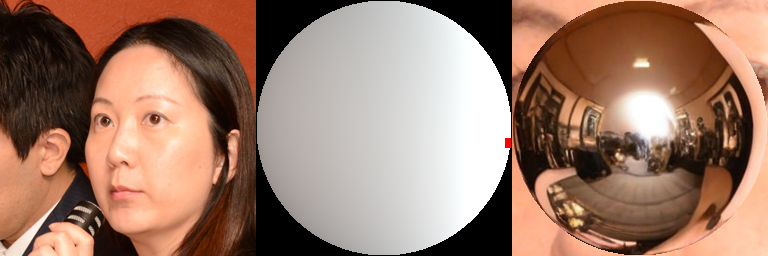

ID:  33
Prompt:  a little girl with long hair


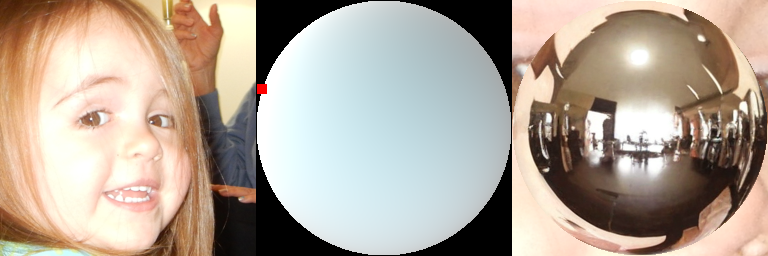

ID:  17848
Prompt:  a man with a black shirt


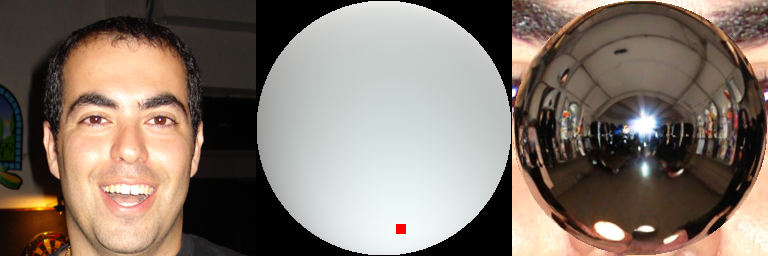

ID:  7791
Prompt:  a woman with long black hair and a microphone


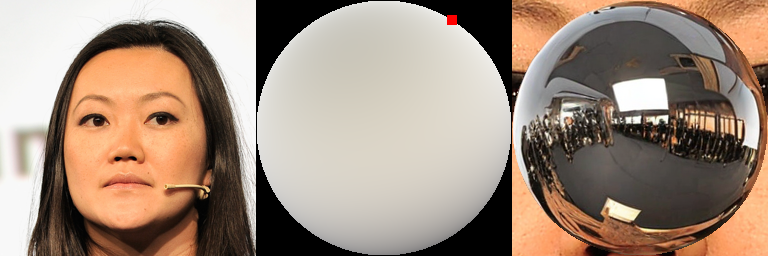

ID:  18654
Prompt:  two women are smiling


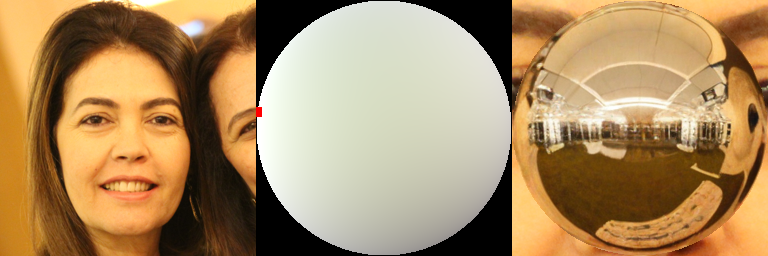

ID:  10088
Prompt:  man wearing a blue shirt


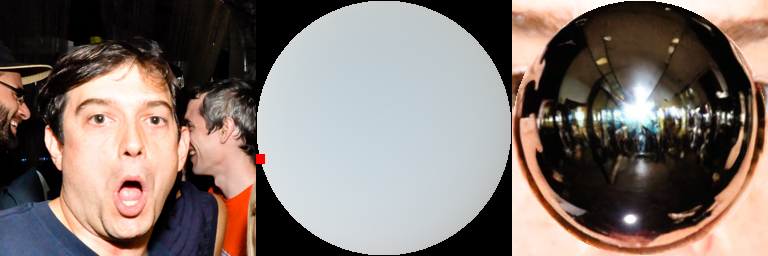

ID:  18852
Prompt:  a boy with a blue hoodie


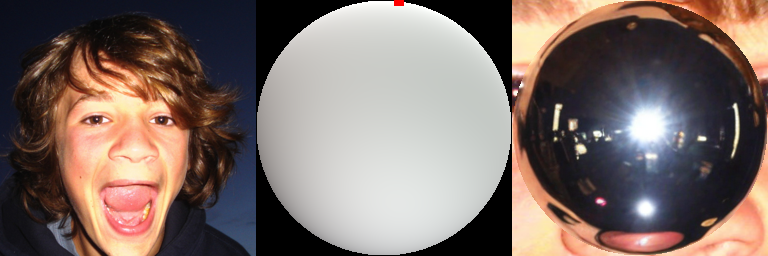

ID:  15379
Prompt:  a man smoking a pipe


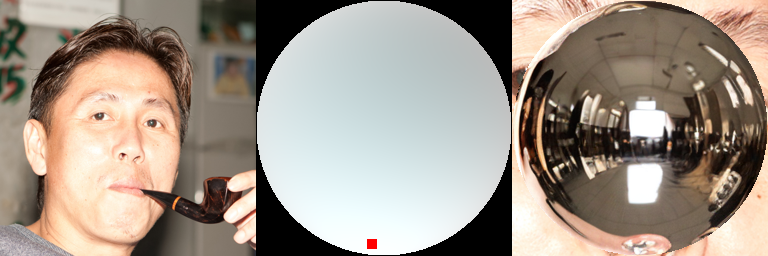

ID:  9851
Prompt:  a woman with a microphone in front of a microphone


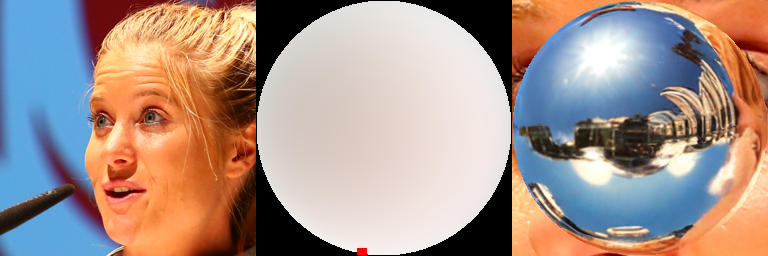

ID:  6472
Prompt:  a woman wearing a black hat


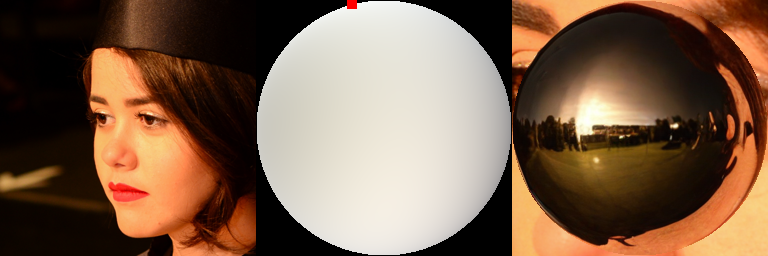

In [16]:
# look into z axis 
top_10_indices = np.argsort(sh_grays[:20000,3])[-10:]
print(top_10_indices)
for i in top_10_indices:
    print("ID: ", i)
    print("Prompt: ", prompt[f"{i:05d}"])
    #sphere = drawSphere(torch.tensor(sh_list[i]))
    # convert sphere from torch tensor to PIL image and display
    #sphere = Image.fromarray((sphere.permute(1,2,0).numpy() * 255.0).astype(np.uint8))
    sphere = Image.open(f'../../datasets/face/face70000/ball/{i // 1000 * 1000:05d}/{i:05d}.png').resize((256, 256))    
    # get source image 
    source = Image.open(f'/pure/tu150/datasets/relight/face/ffhq/images/{i // 1000 * 1000:05d}/{i:05d}.png').resize((256, 256))
    # get ball image
    ball = Image.open(f'/pure/tu150/datasets/relight/face/ffhq/diffusionlight/{i // 1000 * 1000:05d}/square/{i:05d}_ev-00.png').resize((256, 256))    

    # merge source and sphere and ball into one image
    merged = Image.new('RGB', (768, 256))
    merged.paste(source, (0, 0))
    merged.paste(sphere, (256, 0))
    merged.paste(ball, (512, 0))
    display(merged)



In [85]:
import json  

In [107]:

with open('/pure/tu150/datasets/relight/face/ffhq/split/20k_light_x_minus.json','w') as f:
    top_10_indices = np.argsort(sh_grays[:20000,1])[:10]
    output = []
    for i in top_10_indices:
        print(i)
        output.append(f"{int(i//1000*1000):05d}/{i:05d}")
    json.dump(output, f, indent=4)

5363
1237
7647
7158
5359
700
2201
6208
8117
14810


In [108]:
with open('/pure/tu150/datasets/relight/face/ffhq/20k_light_x_plus.json','w') as f:
    top_10_indices = np.argsort(sh_grays[:20000,1])[-10:]
    output = []
    for i in top_10_indices:
        print(i)
        output.append(f"{int(i//1000*1000):05d}/{i:05d}")
    json.dump(output, f, indent=4)

5504
2572
18254
7578
7671
2994
17659
321
7144
1425


In [109]:

with open('/pure/tu150/datasets/relight/face/ffhq/20k_light_y_minus.json','w') as f:
    top_10_indices = np.argsort(sh_grays[:20000,2])[:10]
    output = []
    for i in top_10_indices:
        print(i)
        output.append(f"{int(i//1000*1000):05d}/{i:05d}")
    json.dump(output, f, indent=4)

12615
14528
12213
19321
13905
14050
3575
11037
13145
867


In [110]:

with open('/pure/tu150/datasets/relight/face/ffhq/20k_light_y_plus.json','w') as f:
    top_10_indices = np.argsort(sh_grays[:20000,2])[-10:]
    output = []
    for i in top_10_indices:
        print(i)
        output.append(f"{int(i//1000*1000):05d}/{i:05d}")
    json.dump(output, f, indent=4)

15019
2491
3878
18102
11001
17215
18281
17117
1047
19246


In [111]:

with open('/pure/tu150/datasets/relight/face/ffhq/20k_light_z_minus.json','w') as f:
    top_10_indices = np.argsort(sh_grays[:20000,3])[:10]
    output = []
    for i in top_10_indices:
        print(i)
        output.append(f"{int(i//1000*1000):05d}/{i:05d}")
    json.dump(output, f, indent=4)

3807
1338
5733
7742
9845
2526
5304
16511
9195
46


In [112]:

with open('/pure/tu150/datasets/relight/face/ffhq/20k_light_z_plus.json','w') as f:
    top_10_indices = np.argsort(sh_grays[:20000,3])[-10:]
    output = []
    for i in top_10_indices:
        print(i)
        output.append(f"{int(i//1000*1000):05d}/{i:05d}")
    json.dump(output, f, indent=4)

16822
33
17848
7791
18654
10088
18852
15379
9851
6472
